Analysis Start Time: 2025-03-02
Analysis End Time: 2025-03-16
MARACOOS Region Selected
{'lat': 167, 'lon': 172, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
NewJersey Region Selected
{'lat': 139, 'lon': 103, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
NYHarbor Region Selected
{'lat': 37, 'lon': 60, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
DelawareBay Region Selected
{'lat': 39, 'lon': 35, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
BlockIslandSound Region Selected
{'lat': 47, 'lon': 52, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
LongIslandSound Region Selected
{'lat': 37, 'lon': 69, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
ChesBay Region Selected
{'lat': 63, 'lon': 86, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16
NewEngland Region Selected
{'lat': 139, 'lon': 103, 'time': 337, 'time_1': 1, 'nv': 2}
Today's date: 2025-03-16


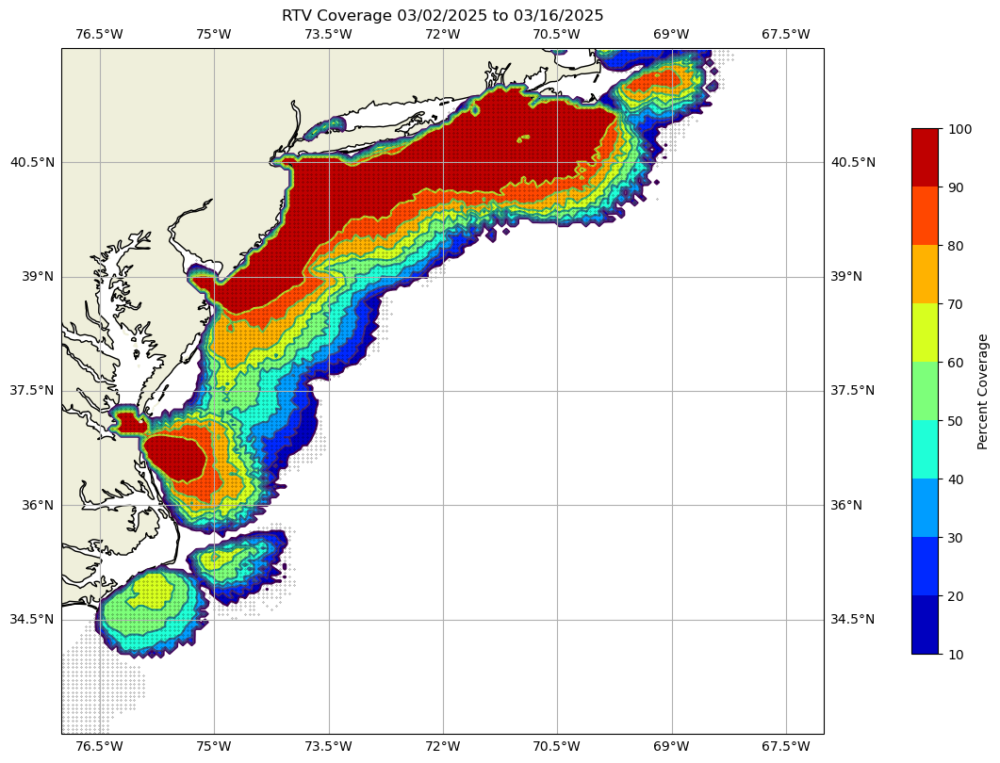

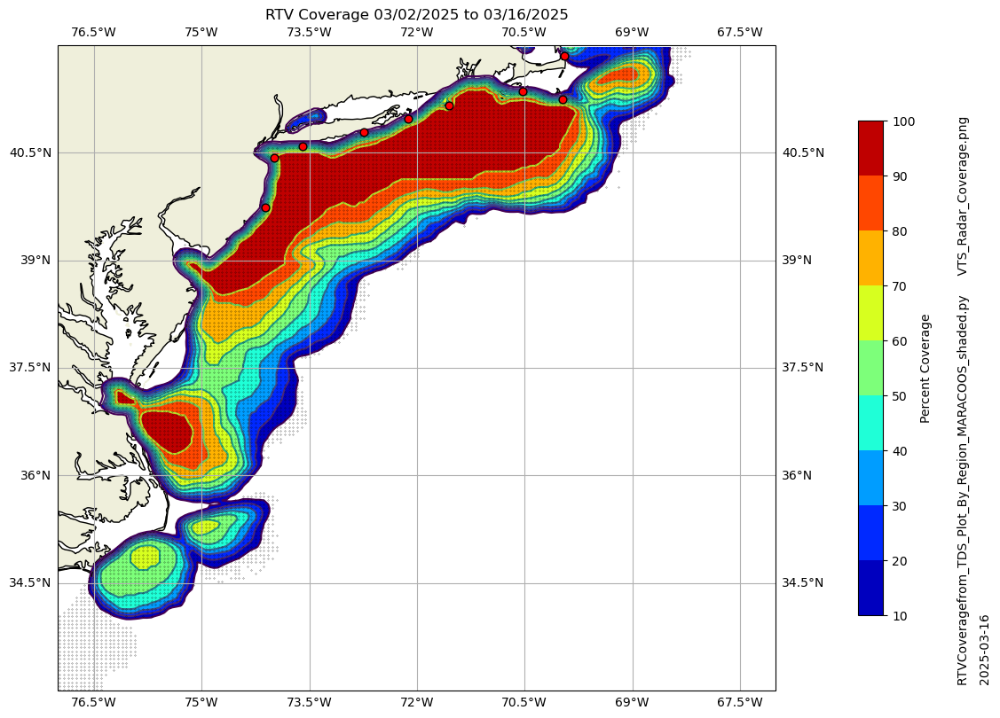

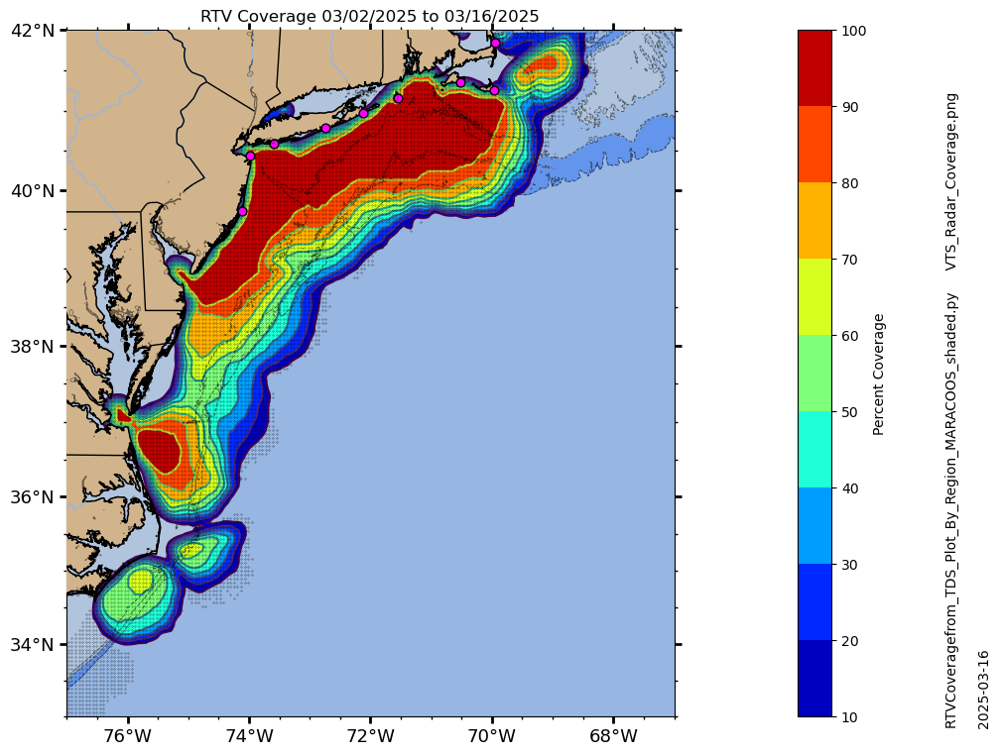

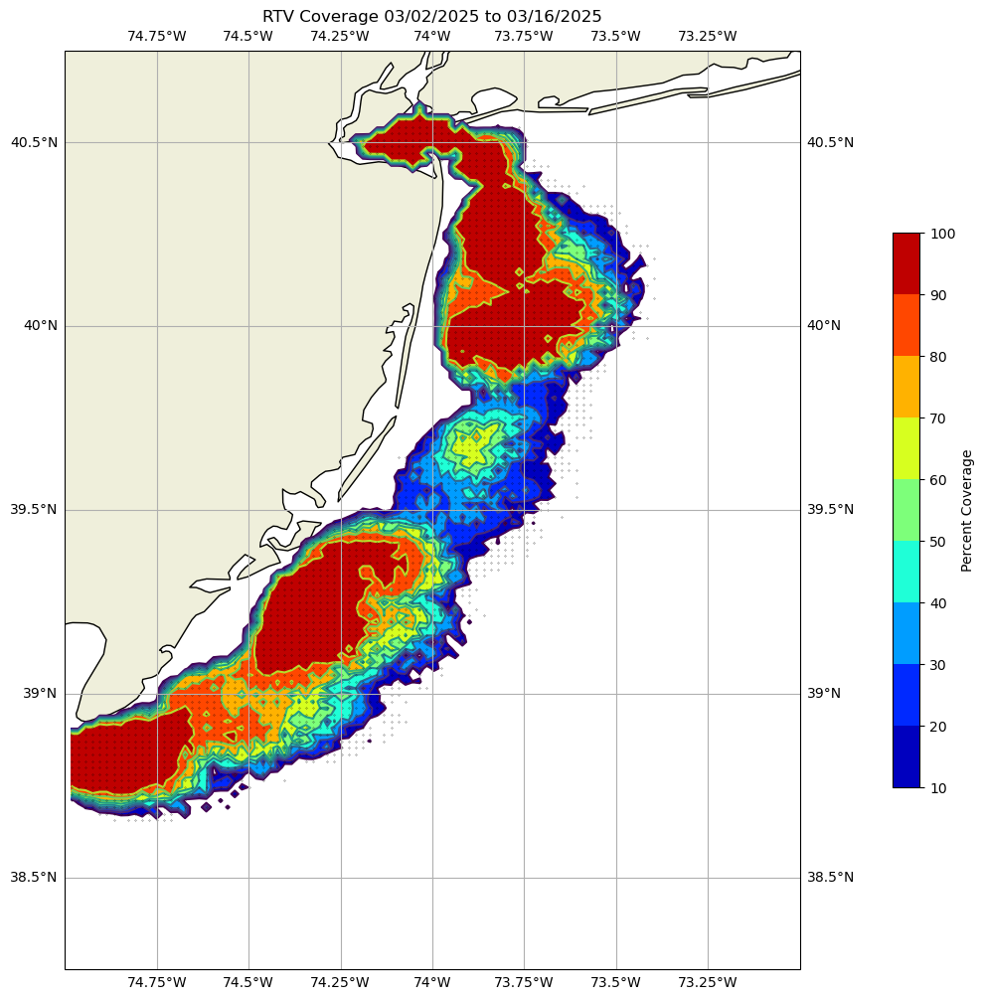

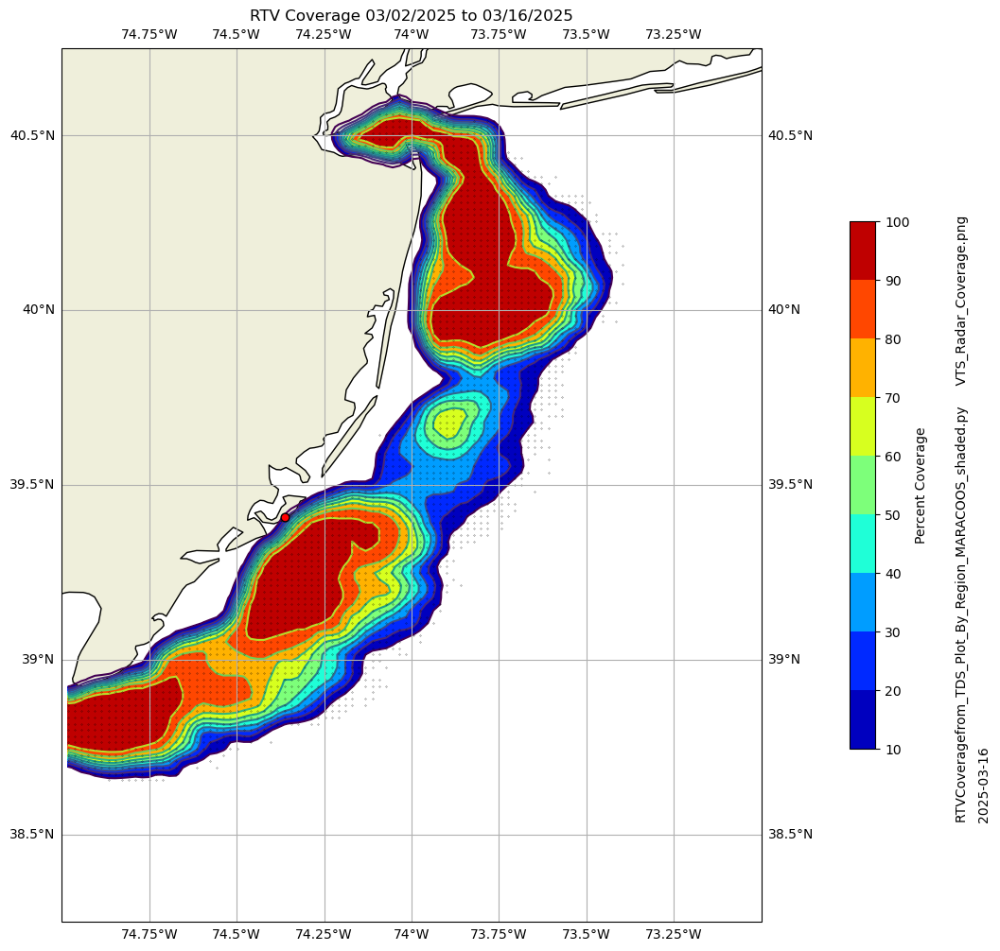

...

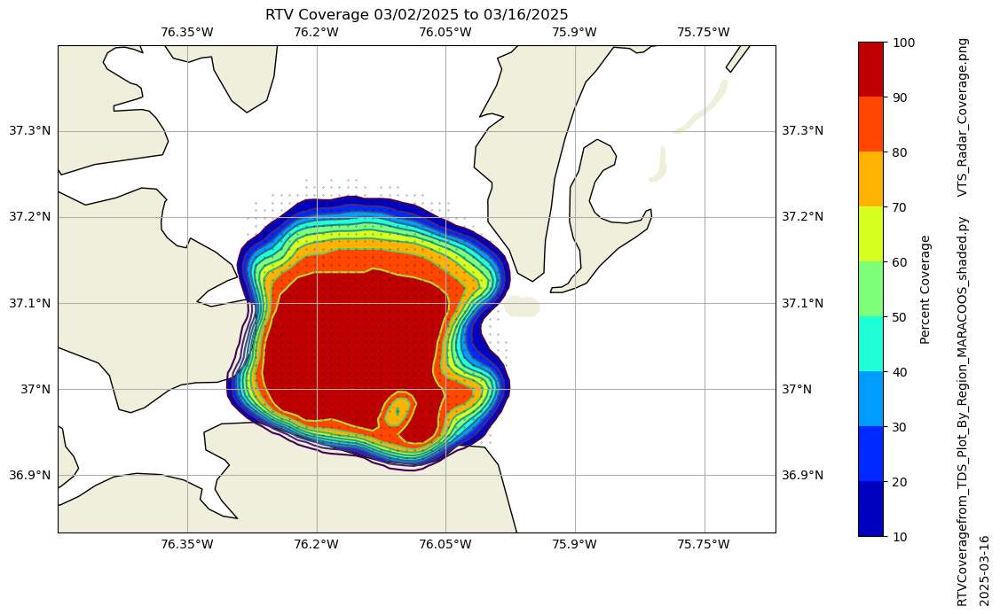

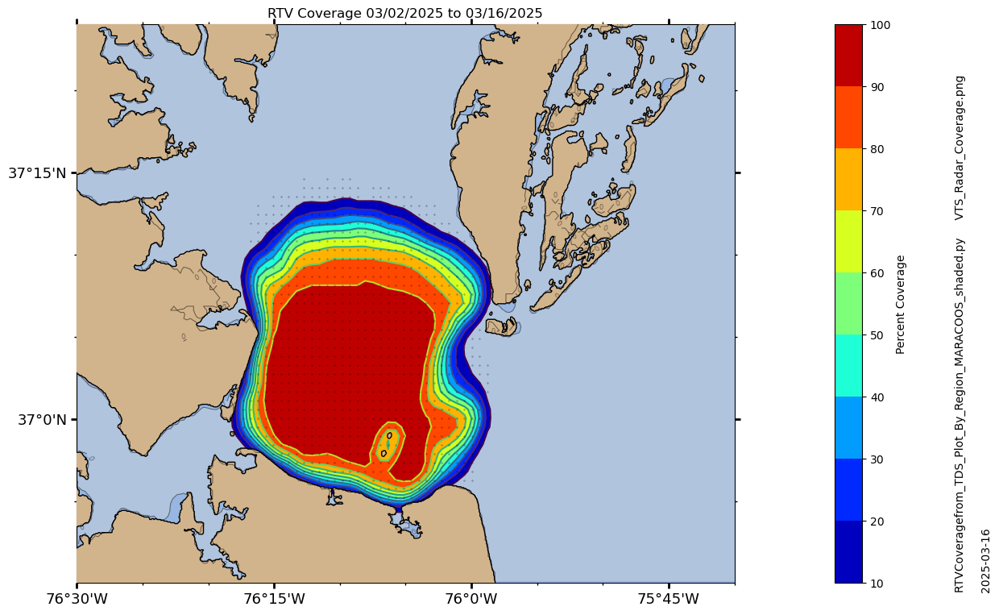

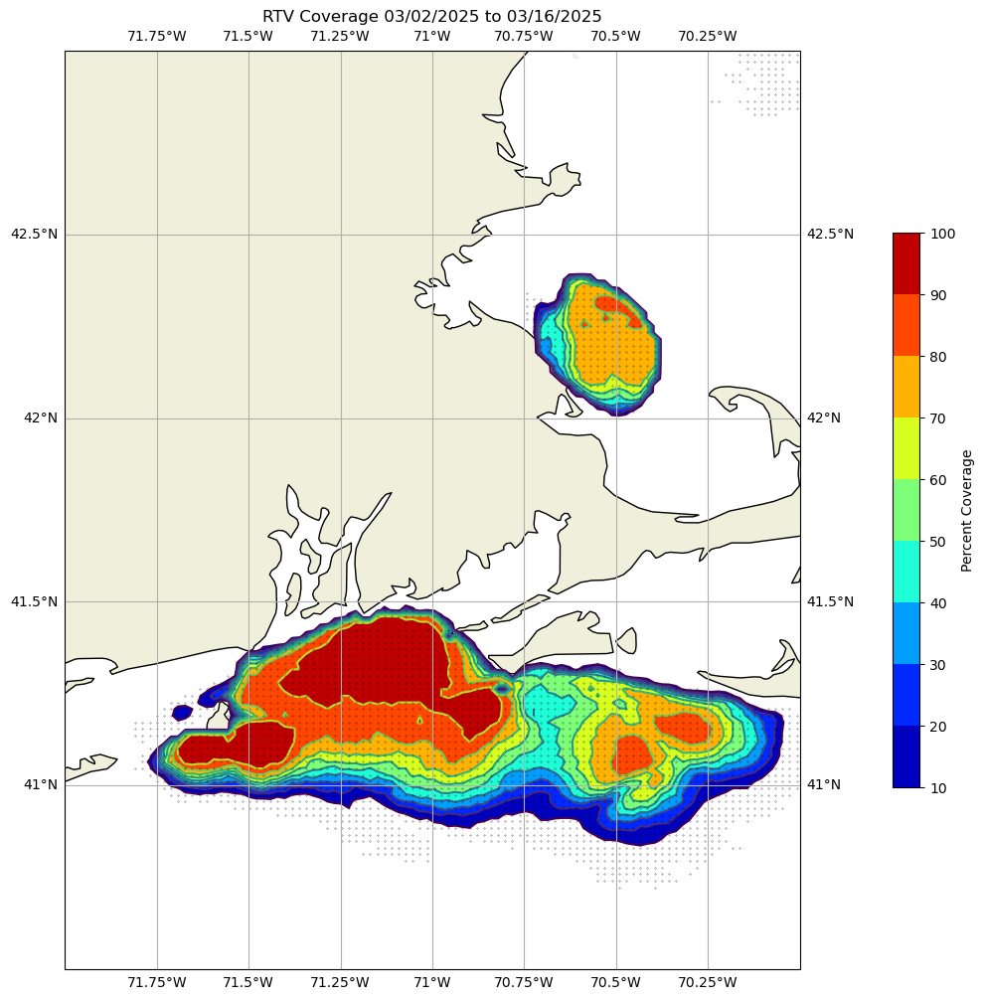

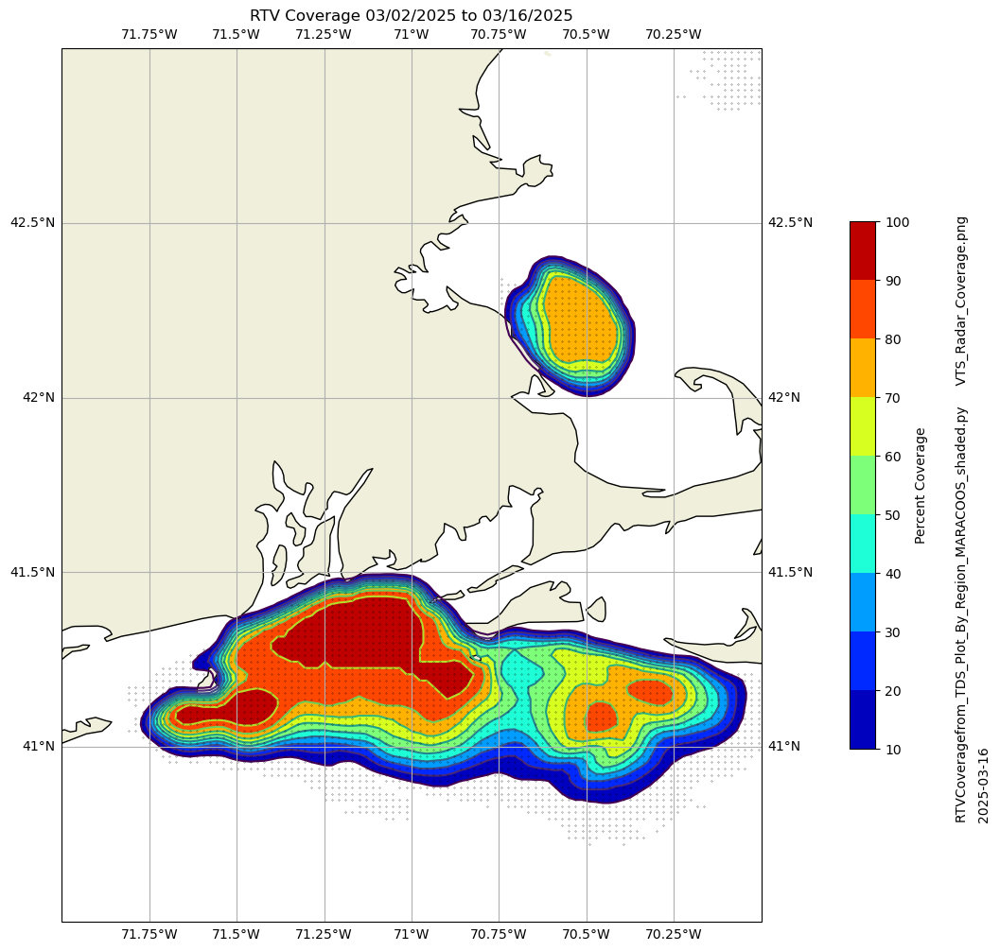

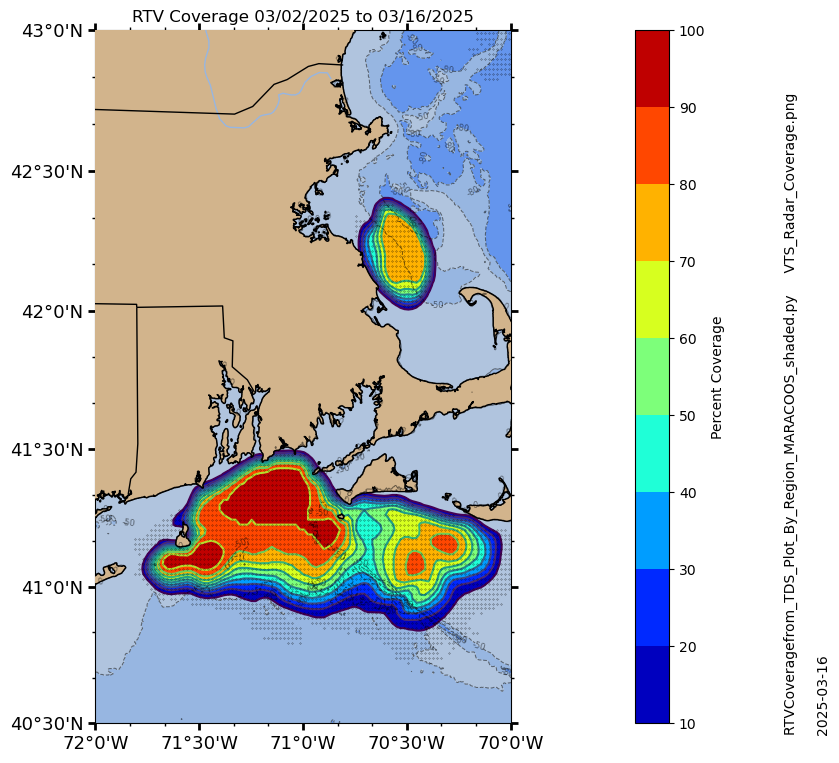

In [2]:
# %load RTVCoveragefrom_TDS_Plot_By_Region_MARACOOS_shaded.py
# %% [markdown]
# # This notebook shows an example of calculating and visualizing the RTV weekly coverage from the latest USWC real time vector product from [HFRnet THREDDS server](http://hfrnet-tds.ucsd.edu/thredds/catalog.html)
# 
# Call %matplotlib inline to have plots shown inline in the notebook
# 
# %matplotlib inline must be called before any other packages are imported

#
#   this script uses the mapping02 environment
#

# %%
%matplotlib inline

# %%
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors,ticker
from cartopy import crs,feature
import cartopy.feature as cfeature
import cartopy.crs as ccrs

import matplotlib
#matplotlib.use('TkAgg')

# %% [markdown]
# ### Import Xarray package, which deals very well with NetCDF formatted data<br>Also import Pandas, which is a data analysis package<br>And scipy.ndimage for gaussian smoothing

# %%
import xarray as xr
import pandas as pd
import scipy.ndimage as ndimage
import datetime as dt
from datetime import date
import netCDF4

# %% [markdown]
# ### load 6km USWC RTV dataset through THREDDS <br>Some other datasets are shown as commented lines below
# You must adjust your map parameters if you change regions
# 
# ### instead of the NetCDF4 library, we will use xarray to read file from TDS
# 

# %%
#USWC region
# netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USWC/6km/hourly/RTV/HFRADAR_US_West_Coast_6km_Resolution_Hourly_RTV_best.ncd')
#netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USWC/1km/hourly/RTV/HFRADAR_US_West_Coast_1km_Resolution_Hourly_RTV_best.ncd')
#netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USWC/2km/hourly/RTV/HFRADAR_US_West_Coast_2km_Resolution_Hourly_RTV_best.ncd')

#USEGC region
# netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/6km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_6km_Resolution_Hourly_RTV_best.ncd')
# netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/2km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_2km_Resolution_Hourly_RTV_best.ncd')
#netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/1km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_2km_Resolution_Hourly_RTV_best.ncd')

#Hawaii region
# netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USHI/6km/hourly/RTV/HFRADAR_US_Hawaii_6km_Resolution_Hourly_RTV_best.ncd')

#CARICOOS region
# netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/PRVI/6km/hourly/RTV/HFRADAR_Puerto_Rico_and_the_US_Virgin_Islands_6km_Resolution_Hourly_RTV_best.ncd')

# %% [markdown]
# ### list variables and dimensions

# %%
# netcdf_data

# %% [markdown]
# ### Show variable information

# %%
# print(netcdf_data.u)
# print(netcdf_data.v)
# print(netcdf_data.time.max())


# %% [markdown]
# ### Grab lat, lon and time variables from dataset

# %%
# time=netcdf_data.time

# %% [markdown]
# ### Check geographic and time range of dataset

# %%
# print("Geographic limits:",netcdf_data.lon.values.min(),netcdf_data.lon.values.max(),netcdf_data.lat.values.min(),netcdf_data.lat.values.max())
# print("Dataset Start Time:",time.values.min())
# print("Dataset End Time:",time.values.max())

# %% [markdown]
# ### Set a time range for analysis<br>Use 7 days from latest observation

# %%
# timeEnd=time.max()
# timeStart=timeEnd-np.timedelta64(30,'D')

# print("Analysis Start Time:",timeStart.values)
# print("Analysis End Time:",timeEnd.values)

# %% [markdown]
# Set a time range for analysis
# Use the last 14 days

# %%
# timeStart=dt.datetime(2025,1,9)
# timeEnd=dt.datetime(2025,1,23)

timeEnd=dt.date.today()
timeStart=timeEnd-dt.timedelta(days=14)



# timeStart=pd.to_datetime(

print("Analysis Start Time:",timeStart)
print("Analysis End Time:",timeEnd)

# %%
# dt.datetime.utcnow()
var=dt.date.today()-dt.timedelta(days=14)

# %%
var

# %% [markdown]
# ### Set geographical limits for the map

# %%
for regionN in range(1, 9):
# for regionN in range(4):



    if regionN==1:

        #MARACOOS, changed latMax from 44 to 42 on 11/18/22 to not count Anthony's radars in Massachusetts Bay
        region='MARACOOS'
        res='6'
        latMax=42 
        latMin=33
        lonMax=-67
        lonMin=-77
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(1,12))+[13,14,15,16,17]
        print (region + ' Region Selected')
        
    elif regionN==2:

        #13 MHz NJ Network
        region='NewJersey'
        res='2'
        latMax=40.75
        latMin=38.25
        lonMax=-73
        lonMin=-75
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(18,21))+list(range(22,26))
        print (region + ' Region Selected')
        
    elif regionN==3:

        #NY Harbor 
        region='NYHarbor'
        res='1'
        latMax=40.66
        latMin=40.33
        lonMax=-73.75
        lonMin=-74.33
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(27,30))
        print (region + ' Region Selected')
        
    elif regionN==4:

        #Delaware Bay 2 km
        region='DelawareBay'
        res='2'
        latMax=39+12/60
        latMin=38+30/60
        lonMax=-74-40/60
        lonMin=-75-20/60
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=[25]+[26]+list(range(35,38))
        print (region + ' Region Selected')
        
    elif regionN==5:

        #Block Island Sound 1 km
        region='BlockIslandSound'
        res='2'
        latMax=41+30/60
        latMin=40+40/60
        lonMax=-71-10/60
        lonMin=-72-10/60
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(30,33))
        print (region + ' Region Selected')
        
    elif regionN==6:

        #Long Island Sound 1 km
        region='LongIslandSound'
        res='1'
        latMax=41+10/60
        latMin=40+50/60
        lonMax=-73-10/60
        lonMin=-73-50/60
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(33,35))
        print (region + ' Region Selected')
        
    elif regionN==7:

        #Chesapeake Bay 1 km
        region='ChesBay'
        res='1'
        latMax=37+24/60
        latMin=36+50/60
        lonMax=-75-40/60
        lonMin=-76-30/60
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(38,41))
        print (region + ' Region Selected')

    elif regionN==8:

        #New England 2 km
        region='NewEngland'
        res='2'
        latMax=43+00/60
        latMin=40+30/60
        lonMax=-70-00/60
        lonMin=-72-00/60
        netcdf_data = xr.open_dataset('http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/'+res+'km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_'+res+'km_Resolution_Hourly_RTV_best.ncd')
        sites=list(range(43,49))
        print (region + ' Region Selected')
        
        
    else:
        print ('Invalid Region Number Given!')
            
    res_str=str(res).zfill(2)

    extent = [lonMin, lonMax, latMin, latMax]

    # %% [markdown]
    # ### subset data using slices of time, lat and lon <br> Show values of dimensions<br>Note: as the size of the requests increases, it may be necessary to chunk data as TDS server may return partial records.<br>My experience shows me that the data size should be less than 55 Mb, but you may be able to get larger requests through without chunking

    # %%
    data=netcdf_data.sel(time=slice(timeStart,timeEnd),lat=slice(latMin,latMax),lon=slice(lonMin,lonMax))
    #data=netcdf_data.sel(time=slice(timeStart,timeEnd))

    print(dict(data.dims))
    data.nbytes/1024/1024

    # %% [markdown]
    # ### calculate the percent coverage of the RTV data<br>If the minimum of totalCount is greater than zero, it is likely the request wasn't processed completely

    # %%
    # count number of observations
    totalCount=data.u.count('time')
    totalCount.min()

    # %%
    netcdf_data.nbytes/1e9

    # %%
    # find grid
    lon,lat=np.meshgrid(totalCount.lon.values,totalCount.lat.values)

    # mask out 0s
    mask=totalCount==0


    # %%
    # calculate percent coverage from totalCount
    percentCoverage=np.ceil((totalCount.values/data.time.size)*100)

    # Smooth with gaussian filter
    Z2 = ndimage.gaussian_filter(totalCount.values,sigma=1)

    # calculate percent coverage from smoothed count
    percentCoverage_smooth=np.ceil((Z2/data.time.size)*100)

    # find the points where the count is greater than 1
    tc=totalCount.to_dataframe()
    goodGrid=tc[tc.u>1].reset_index() 

    bins=np.linspace(10,100,num=10)

    # %% [markdown]
    # ### Plot RTV Coverage

    # %%
    fig=plt.figure(figsize=(12,12))
    ax = plt.axes(projection=crs.PlateCarree())
    ax.gridlines(linewidth=.5, color='gray', alpha=0.5, linestyle='-')

    ax.set_title('RTV Coverage ' +timeStart.strftime("%m/%d/%Y")+ ' to ' + timeEnd.strftime("%m/%d/%Y"))
    # ax.set_title('RTV Coverage: '+np.datetime_as_string(timeStart, unit='h')+' to '+np.datetime_as_string(timeEnd, unit='h'))
    ax.set_extent([lonMin,lonMax,latMin,latMax])
    CF=ax.contourf(lon,lat,percentCoverage,bins,cmap='jet')
    ax.contour(lon,lat,percentCoverage,bins)
    ax.plot(goodGrid.lon,goodGrid.lat,'.',markersize=.4,color='black')

    ax.add_feature(feature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face',facecolor=feature.COLORS['land']))
    plt.colorbar(CF,label="Percent Coverage",fraction=0.030, pad=0.1)
    ax.coastlines(resolution='10m',color='k')
    ax.gridlines(draw_labels=True)
    # plt.tight_layout()

    # %%
    confFilename = 'VTS_Radar_Coverage.png'
    confScript='RTVCoveragefrom_TDS_Plot_By_Region_MARACOOS_shaded.py'
    # confPrintPath ='/Users/roarty/COOL/01_CODAR/MARACOOS_II/20200917_Python_Plots/'
    # confPrintPath ='/Users/roarty/COOL/01_CODAR/MARACOOS_III/20211207_NN_Coverage/'
    # confPrintPath ='/Users/roarty/COOL/01_CODAR/MARACOOS_III/20220222_MARACOOS_Coverage/'
    #confPrintPath ='/Users/roarty/COOL/01_CODAR/MARACOOS_III/20210607_Operator_Calls/'


    # %%
    from datetime import date

    today = date.today()
    print("Today's date:", today)

    # load the lat and lon of the HFR stations

    datafile='C:/Users/csmit/OneDrive/Desktop/MOO2024-2025/Shadow/maracoos_codar_sites_2023.csv'
    #df=pd.read_csv(datafile,error_bad_lines=False, sep='\s+',parse_dates=[3])
    df=pd.read_csv(datafile)
    df.head()
    df

    lons=df.iloc[sites,3]
    lats=df.iloc[sites,4]

    # %% [markdown]
    # ### Plot the smoothed RTV coverage

    # %%
    fig=plt.figure(figsize=(12,12))
    ax = plt.axes(projection=crs.PlateCarree())
    ax.gridlines(linewidth=.5, color='gray', alpha=0.5, linestyle='-')

    ax.set_title('RTV Coverage ' +timeStart.strftime("%m/%d/%Y")+ ' to ' + timeEnd.strftime("%m/%d/%Y"))
    # ax.set_title('RTV Coverage: '+np.datetime_as_string(timeStart, unit='h')+' to '+np.datetime_as_string(timeEnd, unit='h'))
    ax.set_extent([lonMin,lonMax,latMin,latMax])
    CF=ax.contourf(lon,lat,percentCoverage_smooth,bins,cmap='jet')
    ax.contour(lon,lat,percentCoverage_smooth,bins)
    ax.plot(goodGrid.lon,goodGrid.lat,'.',markersize=.4,color='black')

    ax.add_feature(feature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face',facecolor=feature.COLORS['land']))
    plt.colorbar(CF,label="Percent Coverage",fraction=0.030, pad=0.1)
    ax.coastlines(resolution='10m',color='k')
    ax.gridlines(draw_labels=True)
    # plt.tight_layout()

    # plot the location of the HFR sites
    plt.scatter(lons, lats, zorder=100, c='r', s=40,edgecolor='black',transform=ccrs.PlateCarree())

    #confFilename='/Users/roarty/COOL/01_CODAR/MARACOOS_II/20200917_Python_Plots/'
    # confFilename='HFRNet_Coverage_' + region +'_' + np.datetime_as_string(timeStart, unit='h') +'_'+ np.datetime_as_string(timeEnd, unit='h')
    #confFilename='HFRNet_Coverage_' + region +'_Resolution' + res_str + '_' + timeStart.strftime("%Y%m%d") +'_'+ timeEnd.strftime("%Y%m%d")





    plt.figtext(0.97,0.2,confScript+'     '+confFilename,  fontsize=10, rotation=90)
    plt.figtext(0.99,0.2,today,  fontsize=10, rotation=90)

    # fig.savefig(confPrintPath  + confFilename + '.png', bbox_inches='tight', pad_inches=0.02, dpi=150)
    #plt.savefig('test.jpg', bbox_inches='tight', pad_inches=0.02, dpi=150)
    # plt.savefig('test.png')

    # fig.savefig('test.png',dpi=300)

    # %% information for shaded bathymetry

    import cool_maps.plot as cplt
    levels = [-200, -80, -50, 0] # Contour levels (depths)
    colors = ['cornflowerblue', cfeature.COLORS['water'], 'lightsteelblue',] # contour colors

    # Get bathymetry from srtm15
    bs = cplt.get_bathymetry(extent)

    # %%
   

    extent = [lonMin,lonMax,latMin,latMax]
    # fig, ax = cplt.create(extent, bathymetry=True, isobaths=(-100, -80, -50, -30, -10), figsize=(16,9))
    fig, ax = cplt.create(extent, bathymetry=True, isobaths=levels, figsize=(16,9))

    # add filled contour to map
    cs = ax.contourf(bs['longitude'], bs['latitude'], bs['z'], levels, colors=colors, transform=ccrs.PlateCarree(), ticks=False)

    # plot the location of the HFR stations
    plt.scatter(lons, lats, zorder=100, c='magenta', s=40,edgecolor='black',transform=ccrs.PlateCarree())

    proj=ccrs.PlateCarree()

    CF=ax.contourf(lon,lat,percentCoverage_smooth,bins,cmap='jet',transform=proj)
    ax.contour(lon,lat,percentCoverage_smooth,bins,transform=proj)
    ax.plot(goodGrid.lon,goodGrid.lat,'.',markersize=.4,color='black',transform=proj)

    ax.set_title('RTV Coverage ' +timeStart.strftime("%m/%d/%Y")+ ' to ' + timeEnd.strftime("%m/%d/%Y"))

    plt.colorbar(CF,label="Percent Coverage",fraction=0.030, pad=0.1)

    plt.figtext(0.97,0.1,confScript+'     '+confFilename,  fontsize=10, rotation=90)
    plt.figtext(0.99,0.1,today,  fontsize=10, rotation=90)
    #plt.show()
    #fig.savefig(confPrintPath  + confFilename + '.png', bbox_inches='tight', pad_inches=0.02, dpi=150)







In [6]:
netcdf_data = xr.open_dataset(
    "http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/6km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_6km_Resolution_Hourly_RTV_best.ncd",
    use_cftime=True
)

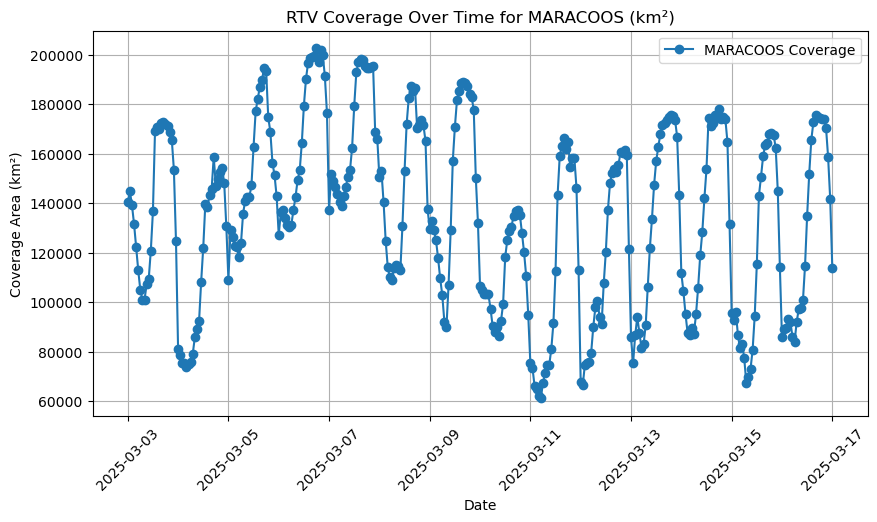

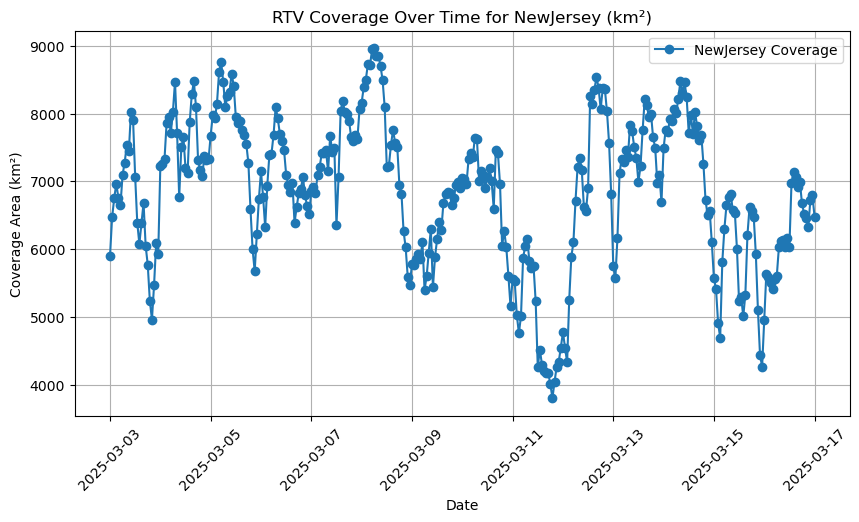

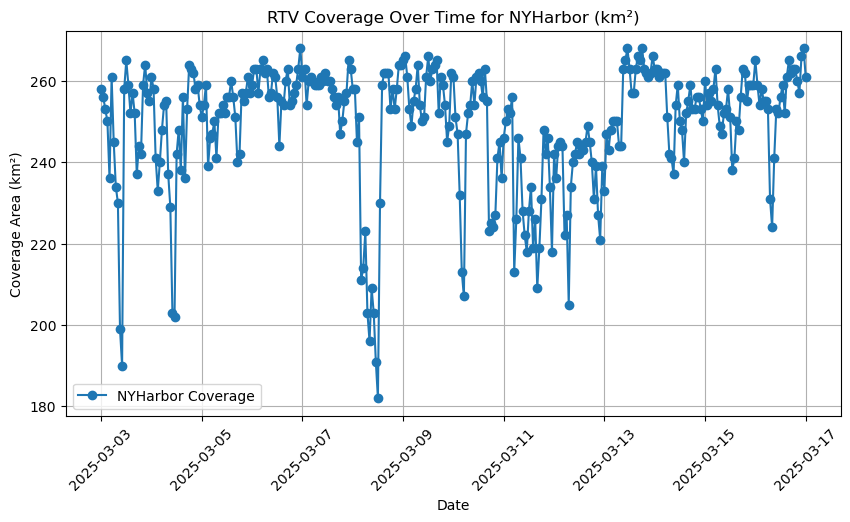

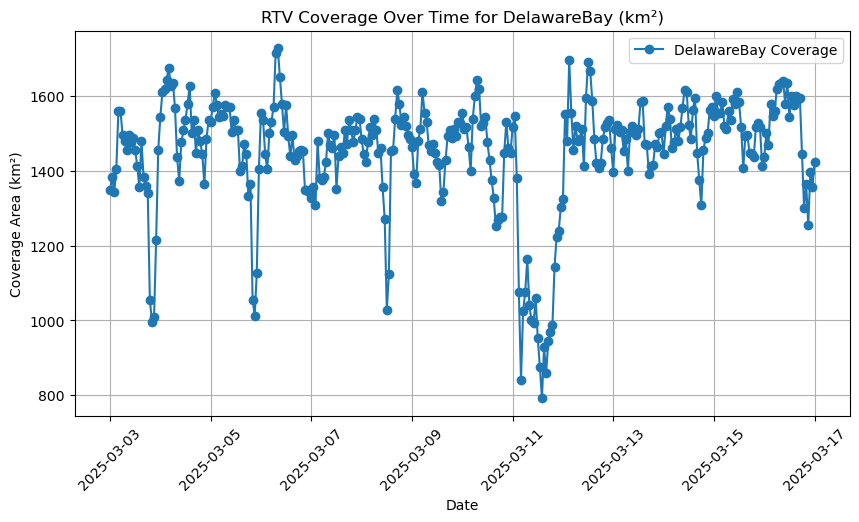

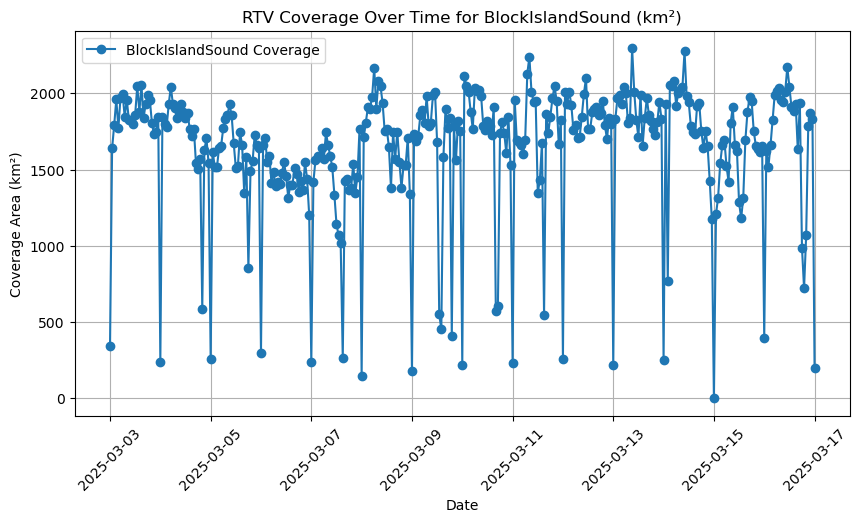

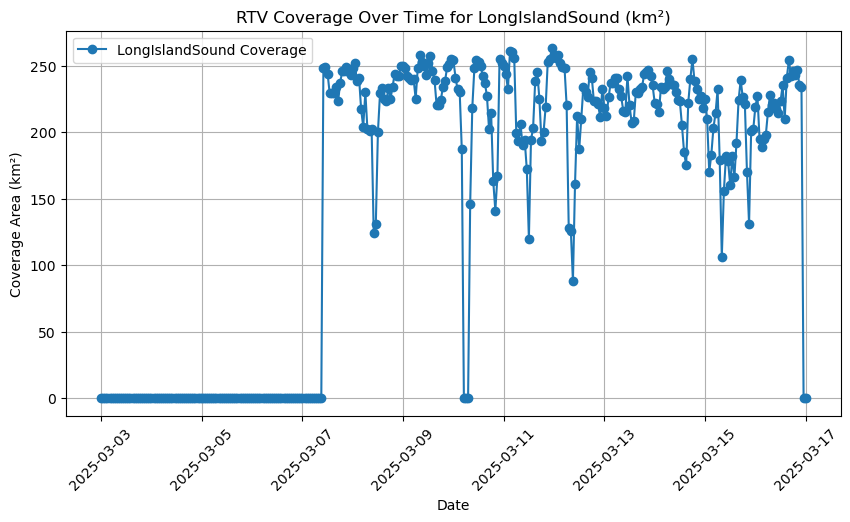

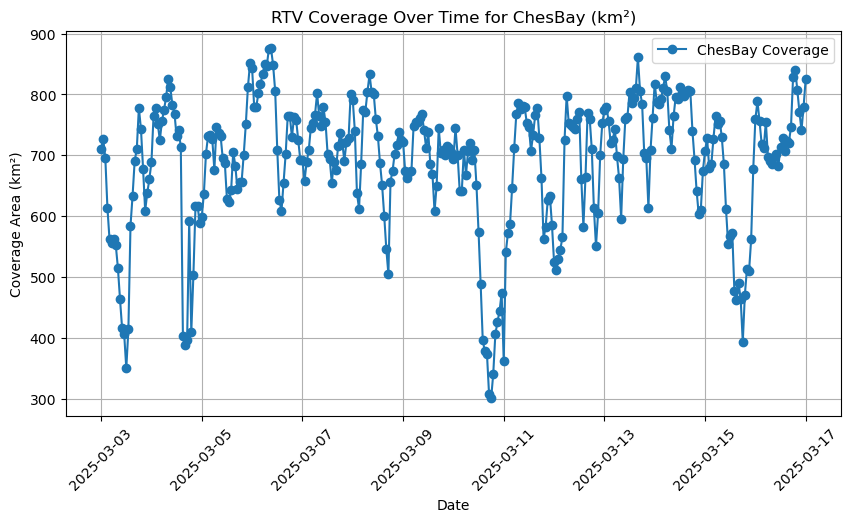

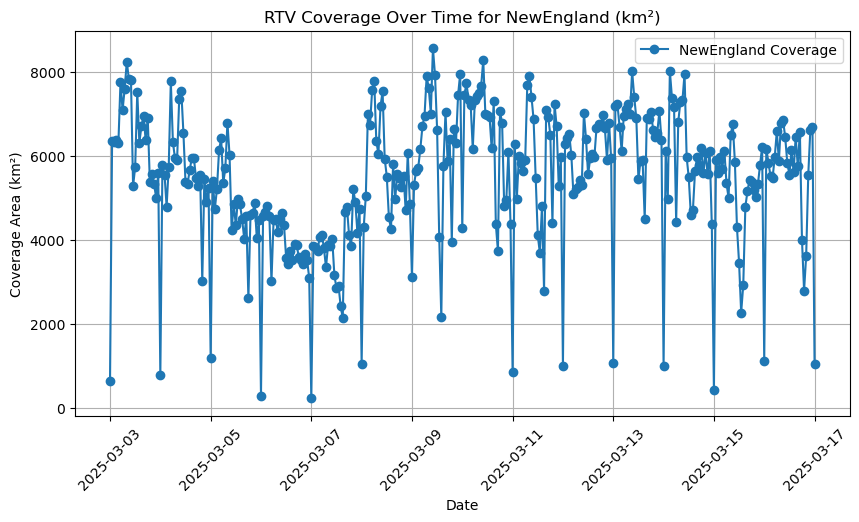

In [9]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import datetime as dt

# Define the time range for analysis
timeEnd = dt.date.today()
timeStart = timeEnd - dt.timedelta(days=14)

# Dictionary to store results
coverage_data = {}

# Define region parameters
regions = {
    1: {"name": "MARACOOS", "res": 6, "latMax": 42, "latMin": 33, "lonMax": -67, "lonMin": -77},
    2: {"name": "NewJersey", "res": 2, "latMax": 40.75, "latMin": 38.25, "lonMax": -73, "lonMin": -75},
    3: {"name": "NYHarbor", "res": 1, "latMax": 40.66, "latMin": 40.33, "lonMax": -73.75, "lonMin": -74.33},
    4: {"name": "DelawareBay", "res": 2, "latMax": 39.2, "latMin": 38.5, "lonMax": -74.67, "lonMin": -75.33},
    5: {"name": "BlockIslandSound", "res": 2, "latMax": 41.5, "latMin": 40.67, "lonMax": -71.17, "lonMin": -72.17},
    6: {"name": "LongIslandSound", "res": 1, "latMax": 41.17, "latMin": 40.83, "lonMax": -73.17, "lonMin": -73.83},
    7: {"name": "ChesBay", "res": 1, "latMax": 37.4, "latMin": 36.83, "lonMax": -75.67, "lonMin": -76.5},
    8: {"name": "NewEngland", "res": 2, "latMax": 43.0, "latMin": 40.5, "lonMax": -70.0, "lonMin": -72.0},
}

# Process each region
for regionN, params in regions.items():
    region = params["name"]
    res = params["res"]
    latMax, latMin = params["latMax"], params["latMin"]
    lonMax, lonMin = params["lonMax"], params["lonMin"]

    # Open the dataset for each region
    dataset_url = f"http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/{res}km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_{res}km_Resolution_Hourly_RTV_best.ncd"
    try:
        netcdf_data = xr.open_dataset(dataset_url)
    except Exception as e:
        print(f"Error accessing dataset for {region}: {e}")
        continue

    # Subset data by time, lat, and lon
    data_time_series = netcdf_data.sel(time=slice(timeStart, timeEnd), lat=slice(latMin, latMax), lon=slice(lonMin, lonMax))

    # Count the number of observations per time step
    totalCount_time = data_time_series.u.count(dim=['lat', 'lon'])

    # Convert count to area (km²)
    area_covered_km2 = totalCount_time * (res ** 2)  # Area per grid cell

    # Convert to DataFrame for plotting
    df = area_covered_km2.to_dataframe().reset_index()

    # Store data for debugging or further analysis
    coverage_data[region] = df

    # Plot time series for this region
    plt.figure(figsize=(10, 5))
    plt.plot(df["time"], df["u"], marker='o', linestyle='-', label=f"{region} Coverage")
    plt.title(f"RTV Coverage Over Time for {region} (km²)")
    plt.xlabel("Date")
    plt.ylabel("Coverage Area (km²)")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.show()

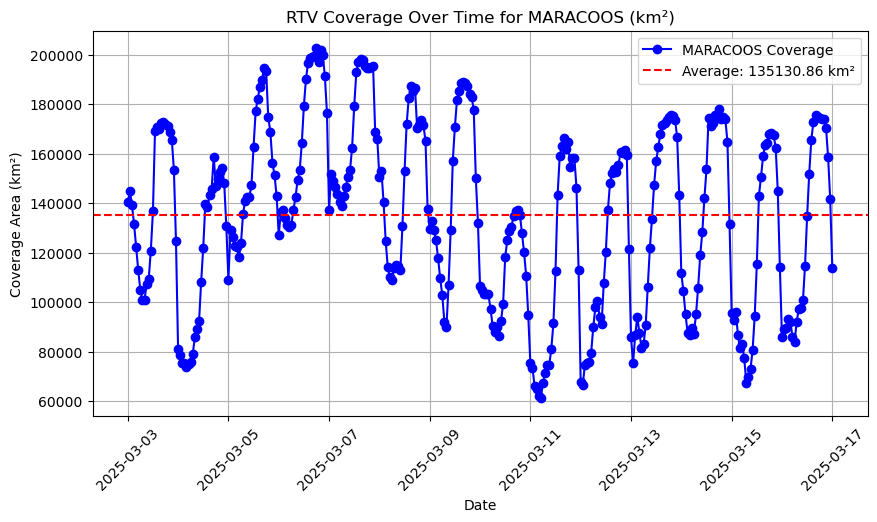

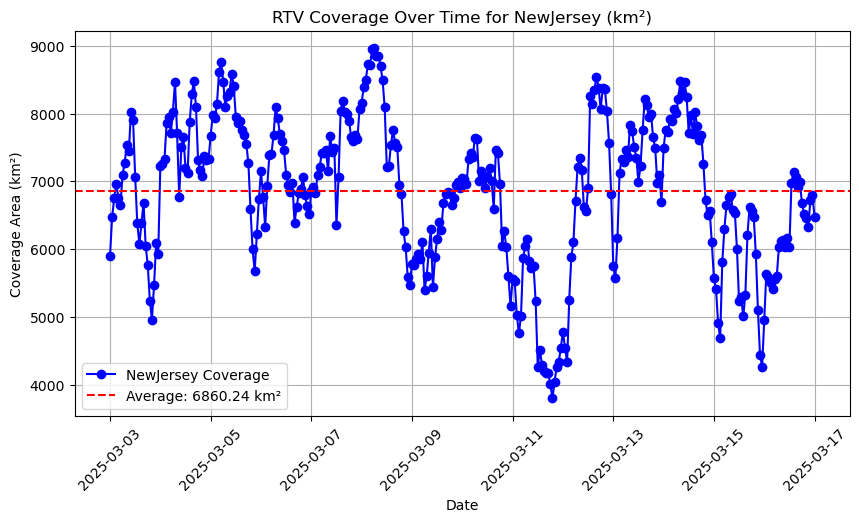

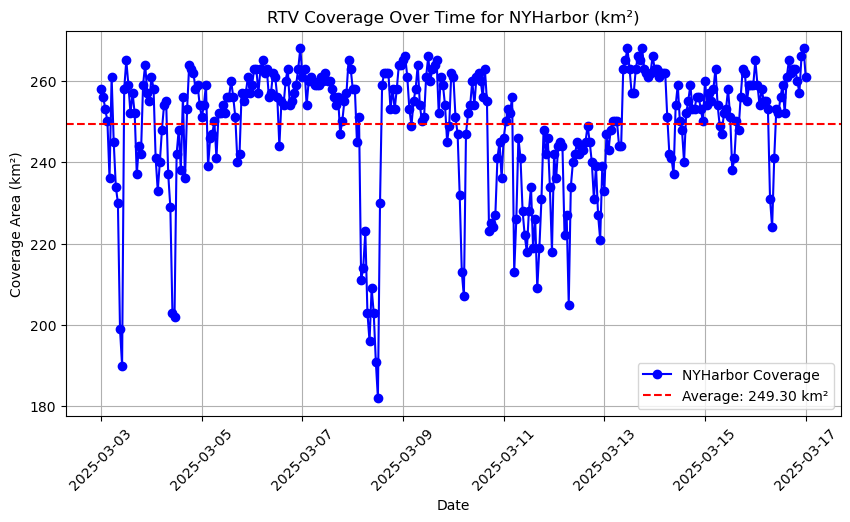

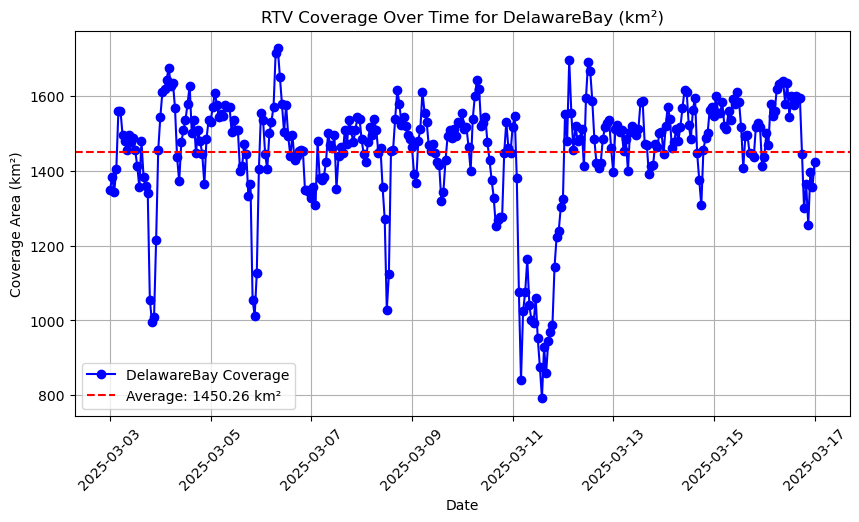

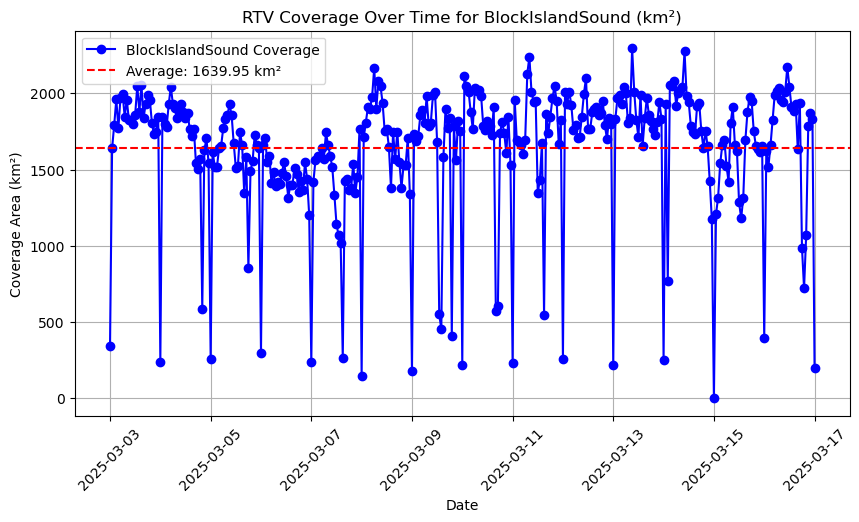

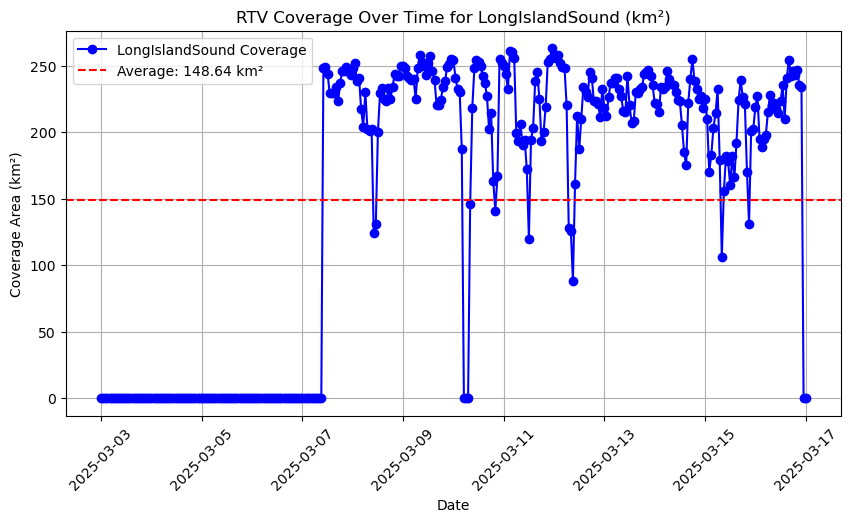

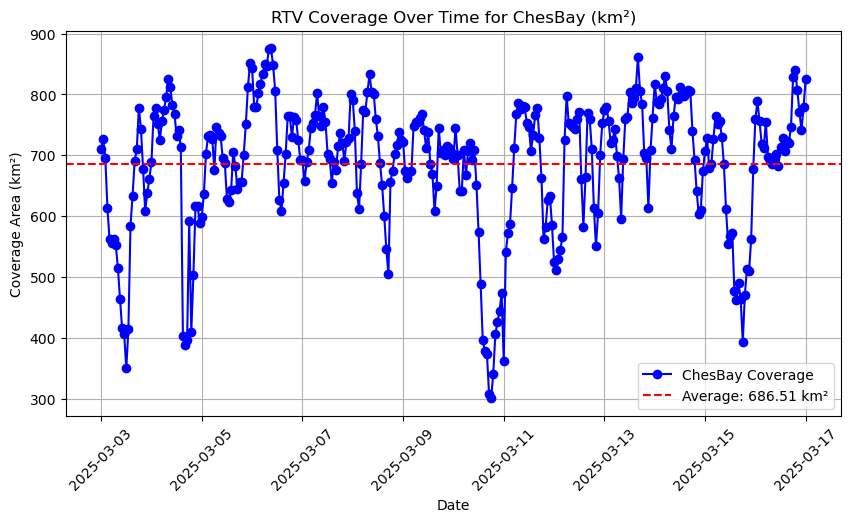

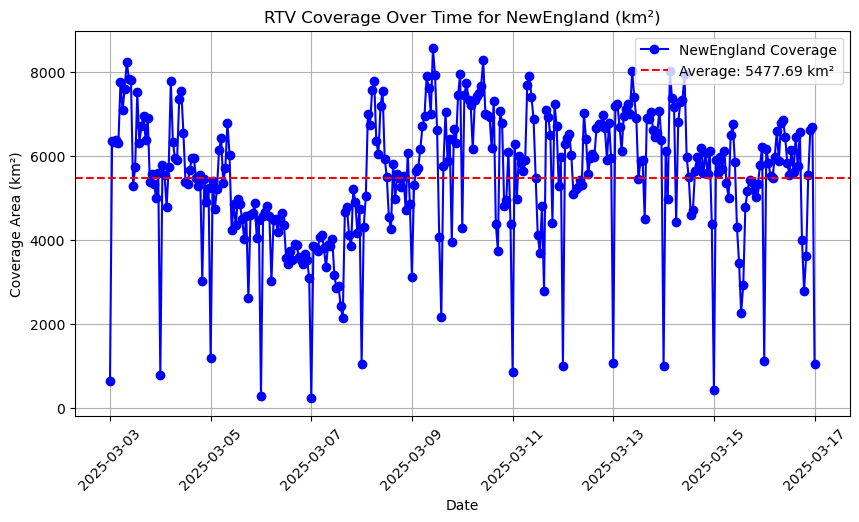

In [10]:
# Define the time range for analysis
timeEnd = dt.date.today()
timeStart = timeEnd - dt.timedelta(days=14)

# Dictionary to store results
coverage_data = {}

# Define region parameters
regions = {
    1: {"name": "MARACOOS", "res": 6, "latMax": 42, "latMin": 33, "lonMax": -67, "lonMin": -77},
    2: {"name": "NewJersey", "res": 2, "latMax": 40.75, "latMin": 38.25, "lonMax": -73, "lonMin": -75},
    3: {"name": "NYHarbor", "res": 1, "latMax": 40.66, "latMin": 40.33, "lonMax": -73.75, "lonMin": -74.33},
    4: {"name": "DelawareBay", "res": 2, "latMax": 39.2, "latMin": 38.5, "lonMax": -74.67, "lonMin": -75.33},
    5: {"name": "BlockIslandSound", "res": 2, "latMax": 41.5, "latMin": 40.67, "lonMax": -71.17, "lonMin": -72.17},
    6: {"name": "LongIslandSound", "res": 1, "latMax": 41.17, "latMin": 40.83, "lonMax": -73.17, "lonMin": -73.83},
    7: {"name": "ChesBay", "res": 1, "latMax": 37.4, "latMin": 36.83, "lonMax": -75.67, "lonMin": -76.5},
    8: {"name": "NewEngland", "res": 2, "latMax": 43.0, "latMin": 40.5, "lonMax": -70.0, "lonMin": -72.0},
}

# Process each region
for regionN, params in regions.items():
    region = params["name"]
    res = params["res"]
    latMax, latMin = params["latMax"], params["latMin"]
    lonMax, lonMin = params["lonMax"], params["lonMin"]

    # Open the dataset for each region
    dataset_url = f"http://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/{res}km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_{res}km_Resolution_Hourly_RTV_best.ncd"
    try:
        netcdf_data = xr.open_dataset(dataset_url)
    except Exception as e:
        print(f"Error accessing dataset for {region}: {e}")
        continue

    # Subset data by time, lat, and lon
    data_time_series = netcdf_data.sel(time=slice(timeStart, timeEnd), lat=slice(latMin, latMax), lon=slice(lonMin, lonMax))

    # Count the number of observations per time step
    totalCount_time = data_time_series.u.count(dim=['lat', 'lon'])

    # Convert count to area (km²)
    area_covered_km2 = totalCount_time * (res ** 2)  # Area per grid cell

    # Convert to DataFrame for plotting
    df = area_covered_km2.to_dataframe().reset_index()

    # Calculate average coverage
    avg_coverage = df["u"].mean()

    # Store data for debugging or further analysis
    coverage_data[region] = df

    # Plot time series for this region with an average line
    plt.figure(figsize=(10, 5))
    plt.plot(df["time"], df["u"], marker='o', linestyle='-', label=f"{region} Coverage", color='blue')
    plt.axhline(y=avg_coverage, color='red', linestyle='--', label=f"Average: {avg_coverage:.2f} km²")
    plt.title(f"RTV Coverage Over Time for {region} (km²)")
    plt.xlabel("Date")
    plt.ylabel("Coverage Area (km²)")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.show()